In [1]:
import noise
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from math import exp
from tqdm import tqdm
import matplotlib.animation as animation
import heapq
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import Image
from scipy.spatial import Voronoi, voronoi_plot_2d
#help(noise)
#http://libnoise.sourceforge.net/glossary/
def sample2D(a,i,j):
    i,j=np.clip(i,0,a.shape[0]-1),np.clip(j,0,a.shape[1]-1)
    i0,i1,j0,j1=int(np.floor(i)),int(np.ceil(i)),int(np.floor(j)),int(np.ceil(j))
    return a[i0,j0]*(i1-i)*(j1-j)+a[i1,j0]*(i-i0)*(j1-j)+a[i0,j1]*(i1-i)*(j-j0)+a[i1,j1]*(i-i0)*(j-j0)
def clip(value, lower, upper):
    return lower if value < lower else upper if value > upper else value

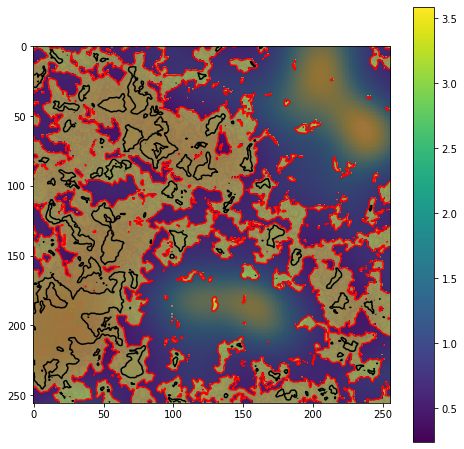

In [2]:
# get elevation
seed=13
townseed=3
histseed=5
#seed=128
#seed=325
#seed=236
#seed=127
size=256
zoom=16
zoom2=8
villagedense=20
y0,x0=0,0
distortion=2
elevation = np.zeros((size,size))
gammas = np.zeros((size,size))
xcoord,ycoord=np.mgrid[0:size,0:size]/zoom
random=np.zeros((size,size))
for i in range(size):
    for j in range(size):
        x,y=i/zoom+x0,j/zoom+y0
        dx=distortion*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+15)
        dy=distortion*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+23)
        gamma=noise.pnoise2(x/zoom2,y/zoom2,octaves=2,persistence=0.5,lacunarity=2,base=seed+66)
        gamma=np.exp(3*gamma+0)
        value=clip(0.5+noise.pnoise2(x+0.5*dx,y+0.5*dy,octaves=6,persistence=0.5,lacunarity=2.0,base=seed+0),0.01,1)
        value=value**gamma
        gammas[i,j]=gamma
        elevation[i,j] = 2*value-1
        random[i,j]=noise.pnoise2(x*8,y*8,octaves=4,persistence=0.7,lacunarity=2.0,base=seed+54)
#r=np.sqrt((xcoord-2)**2+(ycoord-2)**2)
#elevation=0.5-0.4*((r-0.5)/0.5)**2

plt.figure(figsize=(8,8))
plt.imshow(gammas,cmap='viridis')
plt.colorbar()
plt.imshow(elevation>0,alpha=0.5)
plt.contour(np.clip(elevation,0,1),alpha=0.1)
plt.contour(elevation,[0.5],colors='black')
plt.contour(elevation,[0],colors='red')
plt.show()

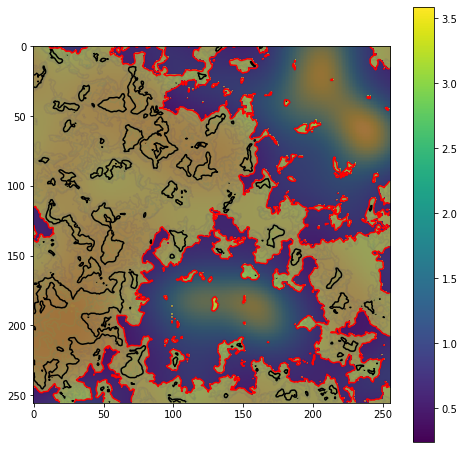

In [3]:
# fillout small oceans
def fill_ocean(minsize,threshold=0,target=0.05):
    visited=elevation<-1
    dirs=((0,1),(1,0),(0,-1),(-1,0))
    for i0 in range(size):
        for j0 in range(size):
            if elevation[i0,j0]<=threshold and not visited[i0,j0]:
                opened=[]
                closed=[]
                count=0
                opened.append((i0,j0))
                visited[i0,j0]=True
                count+=1
                while len(opened)>0:
                    i,j=opened.pop()
                    closed.append((i,j))
                    for oo,delta in enumerate(dirs):
                        ii,jj=i+delta[0],j+delta[1]
                        if 0<=ii and ii<size and 0<=jj and jj<size:
                            if not visited[ii,jj] and elevation[ii,jj]<=threshold:
                                opened.append((ii,jj))
                                visited[ii,jj]=True
                                count+=1
                        else:
                            count+=2*zoom
                if count<minsize:
                    for p in closed:
                        elevation[p[0],p[1]]=target
fill_ocean(2*zoom**2,-0.1,0.1)
fill_ocean(2*zoom**2,0.01,0.05)
plt.figure(figsize=(8,8))
plt.imshow(gammas,cmap='viridis')
plt.colorbar()
plt.imshow(elevation>0,alpha=0.5)
plt.contour(np.clip(elevation,0,1),alpha=0.1)
plt.contour(elevation,[0.5],colors='black')
plt.contour(elevation,[0],colors='red')
plt.show()

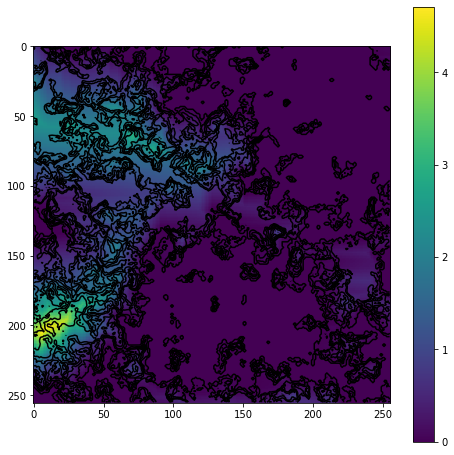

In [4]:
# get rainshadow
dist=np.zeros((size,size))
dist.fill(float('inf'))
dirs=((0,1),(1,0),(0,-1),(-1,0))
opened=[]
for i in range(size):
    for j in range(size):
        if elevation[i,j]<=0:
            opened.append((0,i,j,0))
heapq.heapify(opened)
while len(opened)>0:
    d,i,j,o=heapq.heappop(opened)
    if dist[i,j]>d:
        dist[i,j]=d
        for oo,delta in enumerate(dirs):
            ii,jj=i+delta[0],j+delta[1]
            if 0<=ii and ii<size and 0<=jj and jj<size:
                if elevation[ii,jj]>0:
                    cost=elevation[ii,jj]+0.5*(1-delta[1])
                    if elevation[ii,jj]>0.5:
                        cost+=1
                    if dist[ii,jj]>d+cost:
                        heapq.heappush(opened,(d+cost,ii,jj,oo))
rainshadow=dist.copy()/zoom
del dist,dirs,opened
plt.figure(figsize=(8,8))
plt.imshow(rainshadow,cmap='viridis')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black')
plt.show()



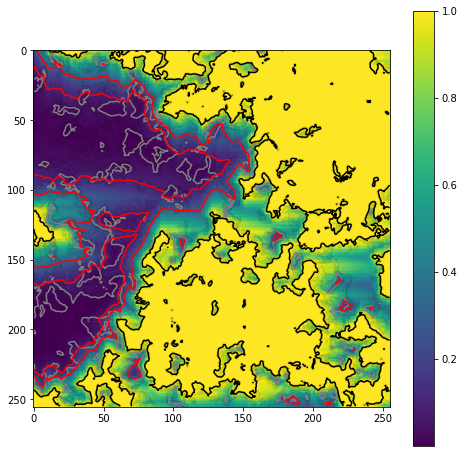

In [5]:
rain=np.exp(-rainshadow/0.5)
plt.figure(figsize=(8,8))
plt.imshow(rain,cmap='viridis')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.contour(rain,[0.1],colors='red')
plt.contour(rain,[0.3],colors='red')
plt.show()

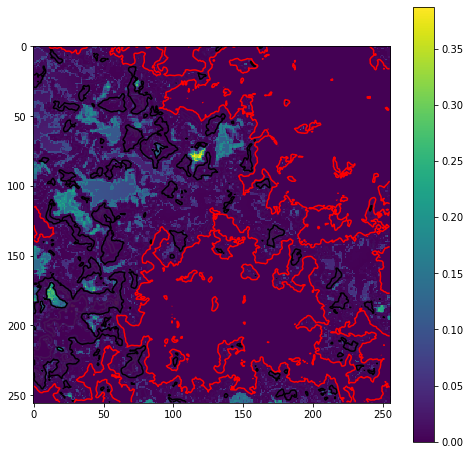

In [6]:
# get lakes and waterflow
# https://medium.com/universe-factory/how-i-generated-artificial-rivers-on-imaginary-continents-747df12c5d4c

fill=np.clip(elevation,0,1)
orig=np.zeros((size,size),dtype=np.int8)
drained=elevation<-1
dirs=((0,1),(1,0),(0,-1),(-1,0))
opened=[]
for i in range(size):
    for j in range(size):
        if elevation[i,j]<-0.01:
            opened.append((0,i,j,0))
heapq.heapify(opened)
#this bfs runs unexpectionally slow. may debug
np.random.seed(seed+2564)
while len(opened)>0:
    f,i,j,o=heapq.heappop(opened)
    if not drained[i,j]:
        drained[i,j]=True
        fill[i,j]=f
        orig[i,j]=(o+2)%4
        for oo,delta in enumerate(dirs):
            ii,jj=i+delta[0],j+delta[1]
            if 0<=ii and ii<size and 0<=jj and jj<size:
                if not drained[ii,jj]:
                    ff=max(f,clip(elevation[ii,jj],0,1))+np.random.random()*0.001
                    #random breaks priority but not break algorithm, why?
                    #ff=max(f,clip(elevation[ii,jj],0,1))+random[ii,jj]*0.01+random[i,j]*0.005
                    heapq.heappush(opened,(ff,ii,jj,oo))
fill-=np.clip(elevation,0,1)
downstream=orig.copy()

plt.figure(figsize=(8,8))
plt.imshow(elevation>0,alpha=0.5)
plt.imshow(fill,cmap='viridis')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),alpha=0.1)
plt.contour(elevation,[0.5],colors='black')
plt.contour(elevation,[0],colors='red')
plt.show()


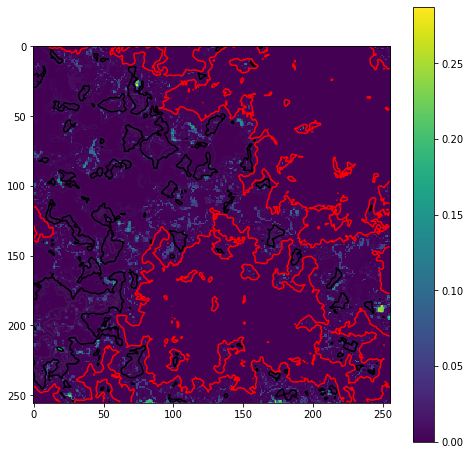

In [7]:
# fillout big lakes
visited=elevation<-1
dirs=((0,1),(1,0),(0,-1),(-1,0))
for i0 in range(size):
    for j0 in range(size):
        if fill[i0,j0]>0.01 and not visited[i0,j0]:
            opened=[]
            closed=[]
            count=0
            opened.append((i0,j0))
            visited[i0,j0]=True
            count+=1
            while len(opened)>0:
                i,j=opened.pop()
                closed.append((i,j))
                for oo,delta in enumerate(dirs):
                    ii,jj=i+delta[0],j+delta[1]
                    if 0<=ii and ii<size and 0<=jj and jj<size:
                        if not visited[ii,jj] and fill[ii,jj]>0.01:
                            opened.append((ii,jj))
                            visited[ii,jj]=True
                            count+=1
            if count>0.2*zoom**2:
                for p in closed:
                    elevation[p[0],p[1]]+=fill[p[0],p[1]]
                    fill[p[0],p[1]]=0
                    
plt.figure(figsize=(8,8))
plt.imshow(elevation>0,alpha=0.5)
plt.imshow(fill,cmap='viridis')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),alpha=0.1)
plt.contour(elevation,[0.5],colors='black')
plt.contour(elevation,[0],colors='red')
plt.show()

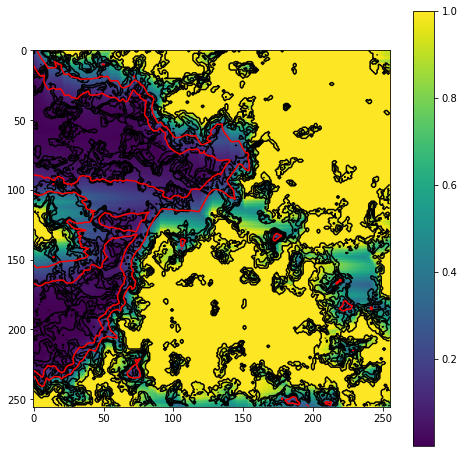

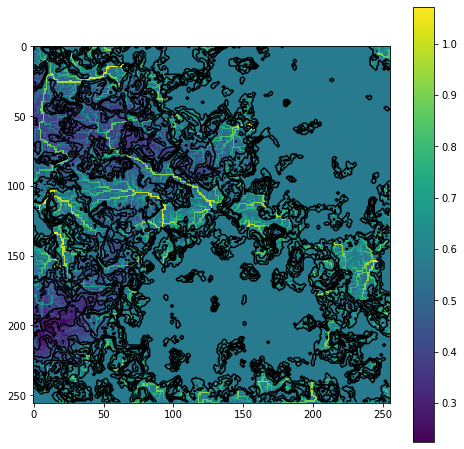

In [8]:
# generate rivers
flow=rain.copy()
degrees=np.zeros((size,size),dtype=np.int8)
dirs=((0,1),(1,0),(0,-1),(-1,0))
opened=[]
for i in range(size):
    for j in range(size):
        if elevation[i,j]>0:
            found=False
            for oo,delta in enumerate(dirs):
                ii,jj=i+delta[0],j+delta[1]
                if 0<=ii and ii<size and 0<=jj and jj<size:
                    if elevation[ii,jj]>0:
                        if downstream[ii,jj]==(oo+2)%4:
                            found=True
                            degrees[i,j]+=1
            if degrees[i,j]==0:
                degrees[i,j]=1
                opened.append((i,j,0))
while len(opened)>0:
    i,j,f=opened.pop()
    flow[i,j]+=f
    degrees[i,j]-=1
    if degrees[i,j]==0:
        o=downstream[i,j]
        ii,jj=i+dirs[o][0],j+dirs[o][1]
        if elevation[ii,jj]>0:
            opened.append((ii,jj,flow[i,j]))
            if flow[i,j]>1.5/zoom and elevation[i,j]+fill[i,j]<elevation[ii,jj]+fill[ii,jj]:
                elevation[ii,jj]=elevation[i,j]+fill[i,j]-fill[ii,jj]
flow/=zoom**2
    
plt.figure(figsize=(8,8))
plt.imshow(rain,cmap='viridis')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black')
plt.contour(rain,[0.1],colors='red')
plt.contour(rain,[0.3],colors='red')
plt.show()
plt.figure(figsize=(8,8))
plt.gray()
plt.imshow(flow**0.1,cmap='viridis')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black')
plt.show()

C:\Users\15617\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: Non-string object detected for the array ordering. Please pass in 'C', 'F', 'A', or 'K' instead
  import sys


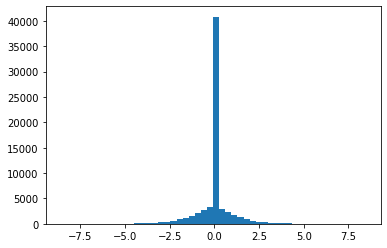

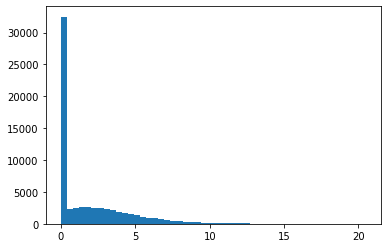

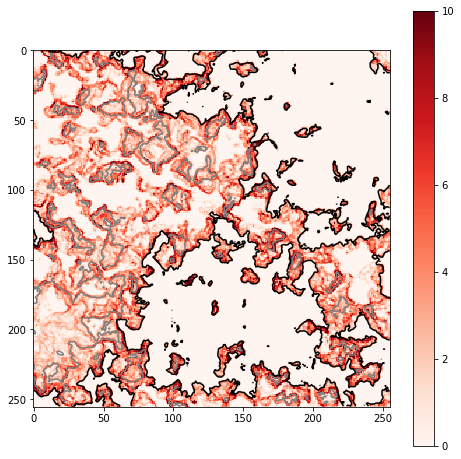

In [9]:
ef=np.clip(elevation,0,1)+fill
gradX=(ef-np.roll(ef,1,axis=1))*zoom
gradX[:,0]=0
gradY=(ef-np.roll(ef,1,axis=0))*zoom
gradY[0,:]=0
uneven=np.abs(gradX)+np.abs(gradY)+np.abs(np.roll(gradX,-1,axis=1))+np.abs(np.roll(gradY,-1,axis=0))
plt.hist(gradX.flatten(()),bins=50)
plt.show()
plt.hist(uneven.flatten(),bins=50)
plt.show()
plt.figure(figsize=(8,8))
plt.imshow(np.clip(uneven,0,10),cmap='Reds')
plt.colorbar()
#plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.show()

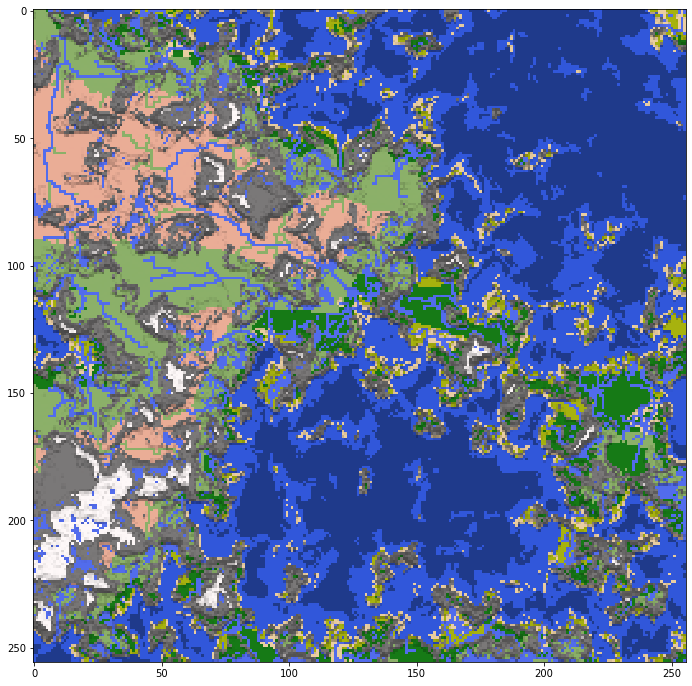

In [10]:
biome_color=dict()
biome_color['deep ocean']=np.array([45,75,155])
biome_color['ocean']=np.array([65,105,225])
biome_color['lake']=np.array([100,125,240])
biome_color['river']=np.array([100,125,240])
biome_color['grassland']=np.array([155,188,122])
biome_color['forest']=np.array([34,139,34])
biome_color['rainforest']=np.array([180,190,24])
biome_color['beach']=np.array([238, 214, 175])
biome_color['desert']=np.array([238, 185, 165])
biome_color['snow']=np.array([255, 250, 250])
biome_color['mountain']=np.array([139, 137, 137])
biome_color['red']=np.array([255, 12, 13])
biome_color['unknown']=np.array([0, 12, 13])
biomeID={name: id for (id, name) in enumerate(biome_color.keys())}
biomeName={id: name for (id, name) in enumerate(biome_color.keys())}
for k,v in enumerate(biomeID):
    biome_color[k]=biome_color[v]

def getBiome(elevation,fill,rain,flow,uneven):
    if elevation < -0.4:
        return 'deep ocean'
    elif elevation < 0:
        return 'ocean'
    else:
        if fill>0.01:
            return 'lake'
        elif flow>1.5/zoom:
            return 'river'
        else:
            if elevation < 0.07:
                return 'beach'
            elif elevation < 0.5:
                if uneven>4:
                    return 'mountain'
                elif rain>0.8 and elevation<0.2:
                    return 'rainforest'
                elif rain+0.5*flow>0.3+0.9*elevation:
                    return 'forest'
                elif rain>0.1 or flow>0.01:
                    return 'grassland'
                else:
                    return 'desert'
            elif elevation < 0.7:
                return 'mountain'
            else:
                return 'snow'
    return 'unknown'


biomes = np.zeros((size,size),dtype=np.int8)
color_unlit = np.zeros((size,size,3))
for i in range(elevation.shape[0]):
    for j in range(elevation.shape[1]):
        name=getBiome(elevation[i,j],fill[i,j],rain[i,j],flow[i,j],uneven[i,j])
        biomes[i,j]=biomeID[name]
        color_unlit[i,j]=biome_color[name]/255
shade=np.cos(np.arctan(gradY)-0.1)*0.4+0.6
color_lit=np.einsum('ijk,ij->ijk',color_unlit,shade)**1.2

plt.figure(figsize=(12,12))
plt.imshow(color_lit)
plt.show()


In [11]:
def pfa(source,cost,banned,cutoff=float('inf')):
    dist=np.zeros((size,size))
    orig=np.zeros((size,size),dtype=np.int8)
    dist.fill(float('inf'))
    orig.fill(-1)
    dirs=((0,1),(1,0),(0,-1),(-1,0))
    opened=[]
    for i in range(size):
        for j in range(size):
            if source[i,j] and not banned[i,j]:
                opened.append((0,i,j,-1))
    heapq.heapify(opened)
    while len(opened)>0:
        d,i,j,o=heapq.heappop(opened)
        if d>cutoff:
            break
        if dist[i,j]>d:
            dist[i,j]=d
            orig[i,j]=(o+2)%4
            for oo,delta in enumerate(dirs):
                ii,jj=i+delta[0],j+delta[1]
                if 0<=ii and ii<size and 0<=jj and jj<size:
                    if not banned[ii,jj]:
                        c=cost[ii,jj,oo]
                        if dist[ii,jj]>d+c:
                            heapq.heappush(opened,(d+c,ii,jj,oo))
    return dist,orig
def sigmoid(x,halfwidth=1):
    return 1/(1+np.exp(-x/(2*halfwidth)))

In [35]:
travel_cost=np.zeros((size,size,4))
travel_cost[:,:,0]=np.abs(gradX)
travel_cost[:,:,1]=np.abs(gradY)
travel_cost[:,:,2]=np.abs(np.roll(gradX,-1,axis=1))
travel_cost[:,:,3]=np.abs(np.roll(gradY,-1,axis=0))#todo check
travel_cost=(travel_cost*5+1)/zoom
for i in range(size):
    for j in range(size):
        if biomeName[biomes[i,j]] in ['river','lake']:
            travel_cost[i,j,:]=0.1/zoom
        if biomeName[biomes[i,j]] in ['ocean']:
            travel_cost[i,j,:]=0.2/zoom
        if biomeName[biomes[i,j]] in ['deep ocean']:
            travel_cost[i,j,:]=0.4/zoom
            
travel_cost_land=travel_cost.copy()
for i in range(size):
    for j in range(size):
        if biomeName[biomes[i,j]] in ['river']:
            travel_cost_land[i,j,:]=5/zoom
        if biomeName[biomes[i,j]] in ['lake','ocean','deep ocean']:
            travel_cost_land[i,j,:]=4/zoom

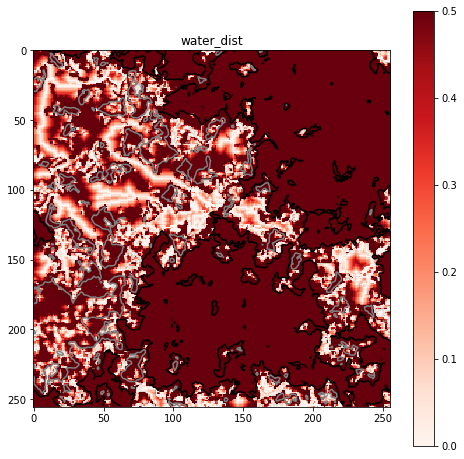

In [13]:
water_dist,dummy=pfa(source=np.isin(biomes,[biomeID['river'],biomeID['lake']]),
                        #cost=np.ones((size,size,4))/zoom,
                        cost=travel_cost,
                        banned=elevation<=0)
plt.figure(figsize=(8,8))
plt.imshow(np.clip(water_dist,0,0.5),cmap='Reds')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.title('water_dist')
plt.show()

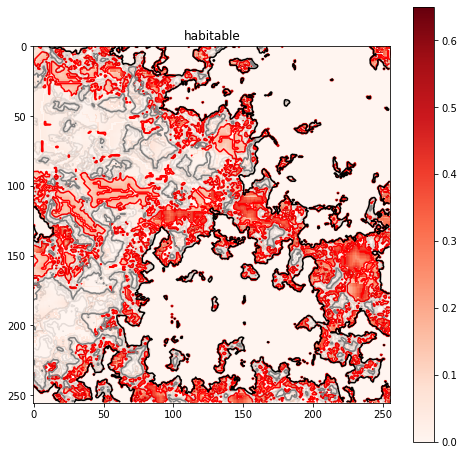

In [14]:
habitable=sigmoid(0.2-water_dist,0.2)+0.5*sigmoid(rain-0.9,0.01)
habitable*=sigmoid(3-uneven,4)
habitable*=\
    +np.where(biomes==biomeID['forest'],1.2,0)\
    +np.where(biomes==biomeID['beach'],0.8,0)\
    +np.where(biomes==biomeID['rainforest'],0.6,0)\
    +np.where(biomes==biomeID['grassland'],0.5,0)\
    +np.where(biomes==biomeID['desert'],0.1,0)\
    +np.where(biomes==biomeID['mountain'],0.2,0)
plt.figure(figsize=(8,8))
plt.imshow(color_lit)
plt.imshow(habitable,cmap='Reds',alpha=1)
plt.colorbar()
plt.contour(habitable,[0.1],colors='red')
plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.title('habitable')
plt.show()

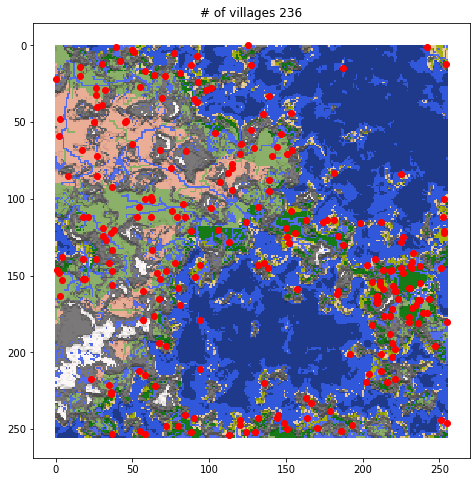

In [15]:
habitable_p=habitable.flatten()/np.sum(habitable)
villages=[]
def getij(ij):
    return int(ij/size),ij%size
np.random.seed(seed+townseed)
for _i in range(int(villagedense*np.sum(habitable)/zoom**2)):
    i,j=getij(np.random.choice(size*size,p=habitable_p))
    villages.append((i,j))
villages=np.array(villages)
plt.figure(figsize=(8,8))
plt.imshow(color_lit)
plt.scatter(villages[:,1],villages[:,0],c='red')
plt.title('# of villages {:d}'.format(len(villages)))
plt.show()

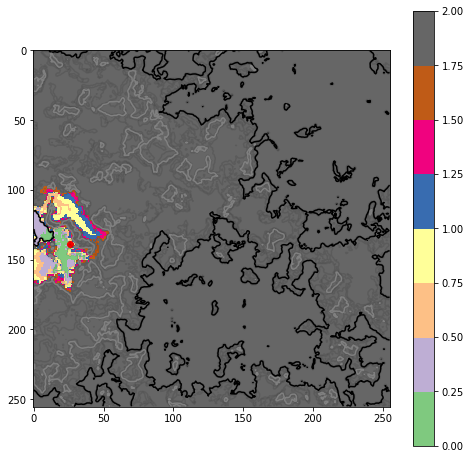

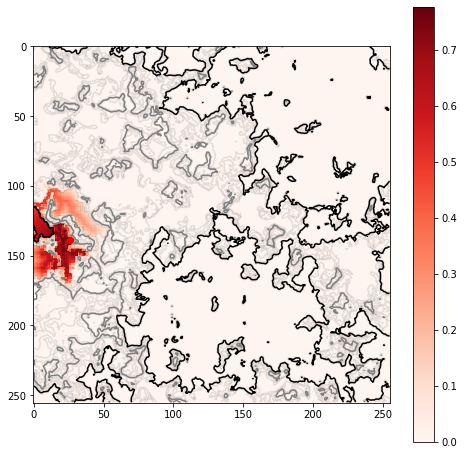

In [16]:
tid=1
source=elevation<-1
source[villages[tid,0],villages[tid,1]]=True
pop_dist,dummy=pfa(source=source,
                    cost=travel_cost,
                    banned=elevation<-1)
plt.figure(figsize=(8,8))
plt.imshow(np.clip(pop_dist,0,2),cmap='Accent')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.scatter(villages[tid,1],villages[tid,0],color='red')
plt.show()
plt.figure(figsize=(8,8))
plt.imshow(sigmoid(0.5-pop_dist,0.2),cmap='Reds')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.scatter(villages[tid,1],villages[tid,0],color='red')
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████| 236/236 [00:13<00:00, 17.74it/s]


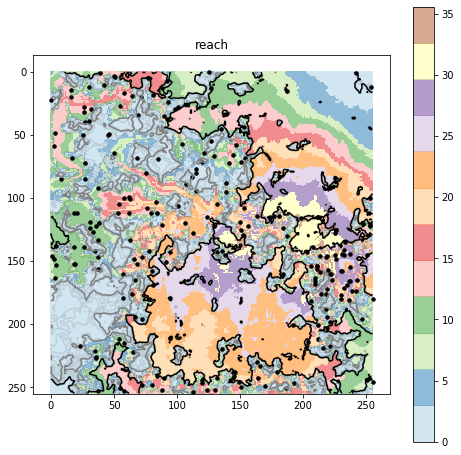

In [17]:
reach=np.zeros((size,size))
def addReach(i,j):
    source=elevation<-1
    source[i,j]=True
    pop_dist,dummy=pfa(source=source,
                        cost=travel_cost,
                        banned=elevation<-1,
                        cutoff=2)
    np.copyto(reach,reach+sigmoid(1-pop_dist,0.5))
    
for tid in tqdm(range(villages.shape[0])):
    addReach(villages[tid,0],villages[tid,1])
    '''plt.figure(figsize=(3,3))
    plt.imshow(np.clip(pop_dist,0,1),cmap='Accent')
    #plt.colorbar()
    plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
    plt.contour(elevation,[0],colors='black')
    plt.contour(elevation,[0.5],colors='grey')
    plt.scatter(villages[tid,1],villages[tid,0],color='red')
    plt.show()'''
plt.figure(figsize=(8,8))
plt.imshow(reach,cmap='Paired',alpha=0.5)
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.scatter(villages[:,1],villages[:,0],c='black',s=12)
plt.title('reach')
plt.show()


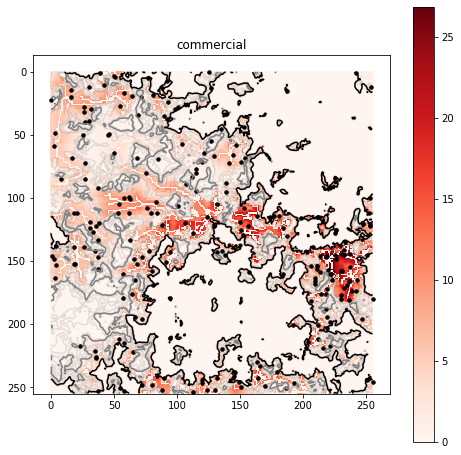

In [18]:
commercial=reach*sigmoid(habitable-0.1,0.1)
commercial[habitable<=0]=0
plt.figure(figsize=(8,8))
#plt.imshow(biomes==biomeID['river'])
plt.imshow(commercial,cmap='Reds')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.scatter(villages[:,1],villages[:,0],c='black',s=12)
plt.title('commercial')
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 78/78 [00:05<00:00, 13.33it/s]


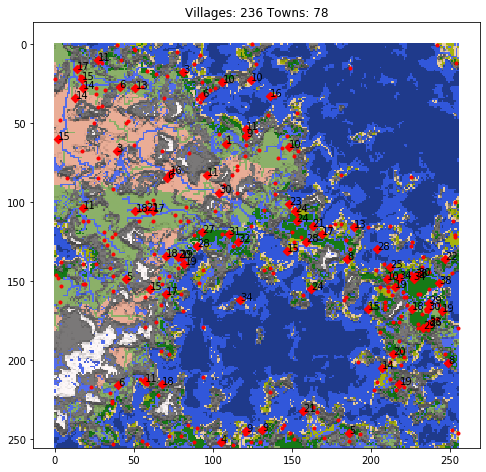

In [19]:
towns=[]
np.random.seed(seed+townseed+1)
for _i in tqdm(range(int(len(villages)/3))):
    commercial=reach*sigmoid(habitable-0.1,0.1)
    commercial[habitable<=0]=0
    commercial_p=commercial.flatten()/np.sum(commercial)
    i,j=getij(np.random.choice(size*size,p=commercial_p))
    towns.append((i,j,reach[i,j]))
    addReach(i,j)
towns=np.array(towns)
plt.figure(figsize=(8,8))
plt.imshow(color_lit)
plt.scatter(villages[:,1],villages[:,0],c='red',marker='.')
plt.scatter(towns[:,1],towns[:,0],c='red',marker='D')
for i in range(len(towns)):
    plt.annotate("{:.0f}".format(towns[i,2]), (towns[i,1], towns[i,0]))
plt.title("Villages: {:d} Towns: {:d}".format(len(villages),len(towns)))
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 78/78 [00:30<00:00,  2.58it/s]


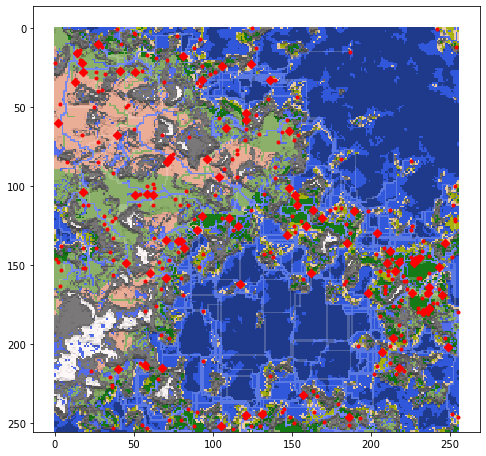

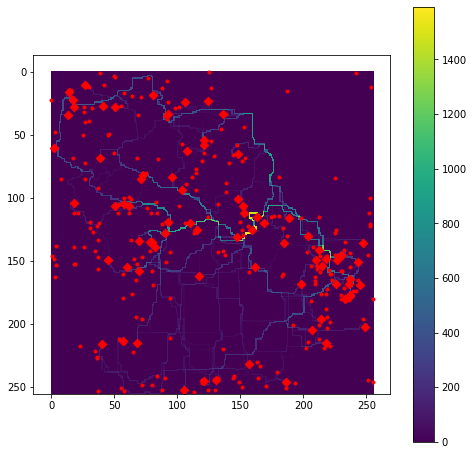

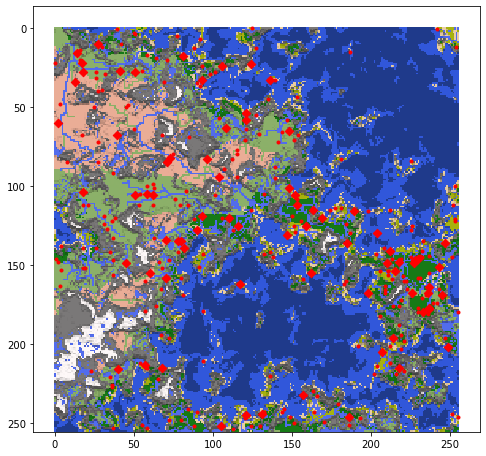

In [20]:
road=np.zeros((size,size))
def walkRoad(road,orig,i,j,idst,jdst,weight=1):
    while i!=idst or j!=jdst:
        road[i,j]+=weight
        o=orig[i,j]
        if o==-1:
            print('dead road!')
            break
        i+=dirs[o][0]
        j+=dirs[o][1]
    road[i,j]+=weight
for _i in tqdm(range(len(towns))):
    i,j=int(towns[_i][0]),int(towns[_i][1])
    source=elevation<-1
    source[i,j]=True
    pop_dist,orig=pfa(source=source,
                        cost=travel_cost,
                        banned=elevation<-1,
                        cutoff=6)
    for _j in range(len(towns)):
        if _j==_i:
            continue
        i1,j1=int(towns[_j][0]),int(towns[_j][1])
        #weight=np.sqrt(towns[_i,2]*towns[_j,2])
        if pop_dist[i1,j1]<6:
            walkRoad(road,orig,i1,j1,i,j,weight=1)
    for _j in range(len(villages)):
        i1,j1=int(villages[_j][0]),int(villages[_j][1])
        if pop_dist[i1,j1]<1.5:
            walkRoad(road,orig,i1,j1,i,j,weight=1)
    '''plt.figure(figsize=(3,3))
    plt.imshow(np.clip(pop_dist,0,1),cmap='Accent')
    #plt.colorbar()
    plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
    plt.contour(elevation,[0],colors='black')
    plt.contour(elevation,[0.5],colors='grey')
    plt.scatter(villages[tid,1],villages[tid,0],color='red')
    plt.show()'''
def blend_mono(source,color,mask):
    a=np.tensordot(mask,[1,1,1],0)
    b=np.tensordot(np.ones(mask.shape),color,0)
    return source*(1-a)+b*a
plt.figure(figsize=(8,8))
plt.imshow(blend_mono(color_lit,[1,1,1],np.where(road>0,0.2,0)))
plt.scatter(villages[:,1],villages[:,0],c='red',marker='.')
plt.scatter(towns[:,1],towns[:,0],c='red',marker='D')
plt.show()
plt.figure(figsize=(8,8))
plt.imshow(road,cmap='viridis')
plt.colorbar()
plt.scatter(villages[:,1],villages[:,0],c='red',marker='.')
plt.scatter(towns[:,1],towns[:,0],c='red',marker='D')
plt.show()
plt.figure(figsize=(8,8))
plt.imshow(color_lit)
plt.scatter(villages[:,1],villages[:,0],c='red',marker='.')
plt.scatter(towns[:,1],towns[:,0],c='red',marker='D')
plt.show()


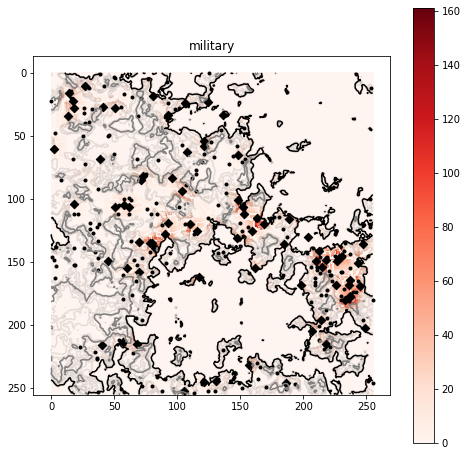

In [21]:
def get_diffuse_kernel(n,normalized=True):
    x,y=np.mgrid[0:n,0:n]
    x,y=x/(n-1)*2-1,y/(n-1)*2-1
    rtval=np.exp(-(x**2+y**2))
    if normalized:
        rtval/=np.sum(rtval)
    return rtval
population=np.zeros((size,size))
for v in villages:
    population[v[0],v[1]]+=1
for t in towns:
    population[int(t[0]),int(t[1])]+=t[2]

military=convolve2d(road,get_diffuse_kernel(np.int(2*zoom*0.4),False),mode='same')
military=military/np.max(military)*np.max(population)
military+=1.0*convolve2d(population,get_diffuse_kernel(np.int(2*zoom*0.6),False),mode='same')
military*=(0.5+sigmoid(uneven-4,0.5))
military[habitable<=0]=0
plt.figure(figsize=(8,8))
plt.imshow(military,cmap='Reds')
plt.colorbar()
plt.contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
plt.contour(elevation,[0],colors='black')
plt.contour(elevation,[0.5],colors='grey')
plt.scatter(villages[:,1],villages[:,0],c='black',marker='.')
plt.scatter(towns[:,1],towns[:,0],c='black',marker='D')
plt.title('military')
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:07<00:00,  5.00it/s]


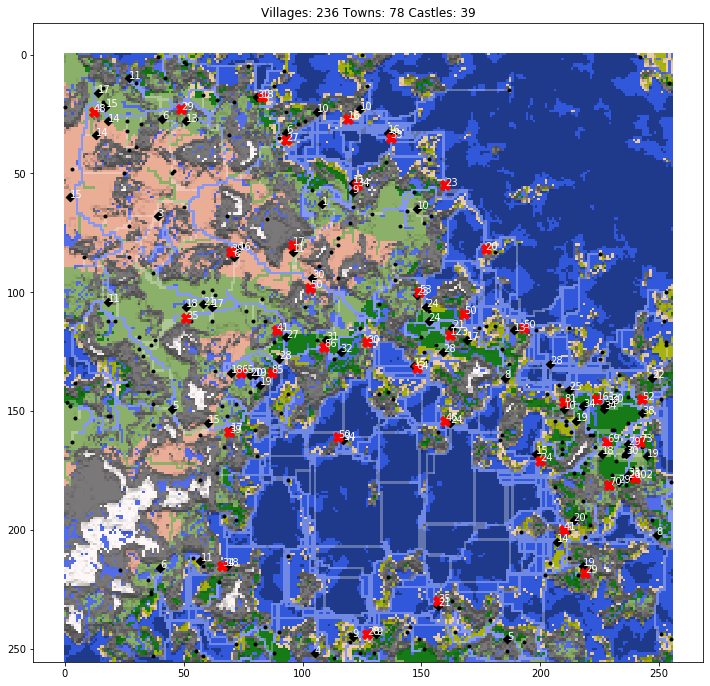

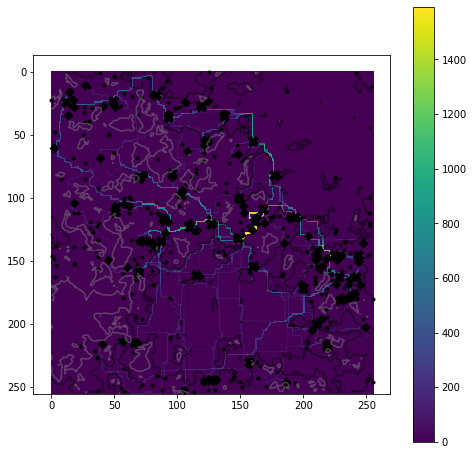

In [22]:
castles=[]
military_masked=military.copy()
#military_p=military.flatten()/np.sum(military)
np.random.seed(seed+6)
for _i in tqdm(range(int(len(villages)/6))):
    #i,j=getij(np.argmax(military_masked))
    military_p=military_masked.flatten()/np.sum(military_masked)
    i,j=getij(np.random.choice(size*size,p=military_p))
    miliwindow=np.zeros((size,size))
    miliwindow[max(0,i-zoom):min(i+zoom,size-1),max(0,j-zoom):min(j+zoom,size-1)]=1
    miliwindow*=military_masked
    i,j=getij(np.argmax(military_masked))
    castles.append((i,j,military[i,j]))# not military masked
    tmp=np.zeros((size,size))
    tmp[i,j]=1
    tmp=1-convolve2d(tmp,get_diffuse_kernel(np.int(2*zoom*1.1),False),mode='same')
    #plt.imshow(military_tmp,cmap='Reds')
    #plt.show()
    military_masked*=tmp
castles=np.array(castles)
plt.figure(figsize=(12,12))
plt.imshow(blend_mono(color_lit,[1,1,1],np.where(road>0,0.3,0)))
plt.scatter(villages[:,1],villages[:,0],c='black',marker='.')
plt.scatter(towns[:,1],towns[:,0],c='black',marker='D')
plt.scatter(castles[:,1],castles[:,0],c='red',marker='X',s=100)
for i in range(len(towns)):
    plt.annotate("{:.0f}".format(towns[i,2]), (towns[i,1], towns[i,0]),color='white')
for i in range(len(castles)):
    plt.annotate("{:.0f}".format(castles[i,2]), (castles[i,1], castles[i,0]),color='white')
plt.title("Villages: {:d} Towns: {:d} Castles: {:d}".format(len(villages),len(towns),len(castles)))
plt.show()
plt.figure(figsize=(8,8))
plt.imshow(road,cmap='viridis')
plt.colorbar()
plt.contour(elevation,[0],colors='black',alpha=0.5)
plt.contour(elevation,[0.5],colors='grey',alpha=0.5)
plt.scatter(villages[:,1],villages[:,0],c='black',marker='.')
plt.scatter(towns[:,1],towns[:,0],c='black',marker='D')
plt.scatter(castles[:,1],castles[:,0],c='black',marker='X',s=100)
plt.show()

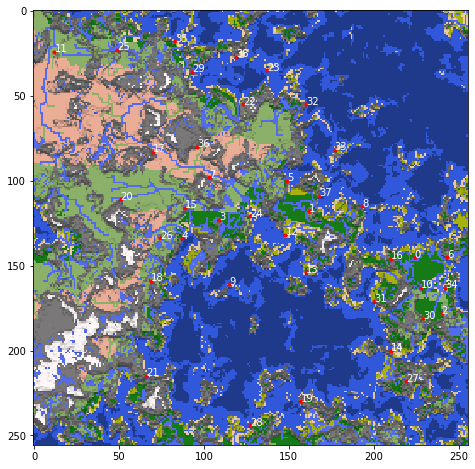

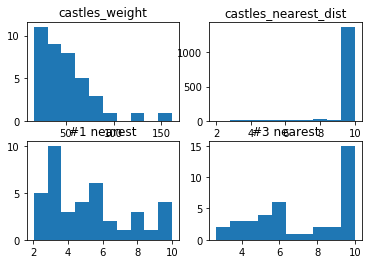

In [36]:
nCastles=len(castles)
castles_cutoff=10
castles_weight=castles[:,2]
castles_dist_approx=np.zeros((nCastles,nCastles))
for _i in range(nCastles):
    i,j=int(castles[_i,0]),int(castles[_i,1])
    source=np.full((size,size),False)
    source[i,j]=True
    dist,dummy=pfa(source=source,
                        cost=travel_cost_land,
                        banned=elevation<-1,
                        cutoff=castles_cutoff)
    for _j in range(nCastles):
        if _j!=_i:
            ii,jj=int(castles[_j,0]),int(castles[_j,1])
            castles_dist_approx[_i,_j]=dist[ii,jj]
castles_dist_approx=np.minimum(castles_dist_approx,castles_dist_approx.T)
castles_dist_approx[castles_dist_approx==0]=castles_cutoff
castles_dist_approx[castles_dist_approx==float('inf')]=castles_cutoff
castles_nearest=np.zeros((nCastles,nCastles),dtype=np.int8)
castles_nearest_dist=np.zeros((nCastles,nCastles))

plt.figure(figsize=(8,8))
plt.imshow(color_lit)
plt.scatter(castles[:,1],castles[:,0],c='red',marker='.')
for i in range(nCastles):
    plt.annotate("{:.0f}".format(i), (castles[i,1], castles[i,0]),color='white')
plt.show()

for _i in range(nCastles):
    castles_nearest[_i]=np.argsort(castles_dist_approx[_i])
    castles_nearest_dist[_i]=castles_dist_approx[_i][castles_nearest[_i]]
#print(castles_nearest)
#print(np.ceil(castles_nearest_dist))
#print(np.ceil(castles_dist_approx))

plt.figure()
plt.subplot(221).hist(castles_weight)
plt.title('castles_weight')
plt.subplot(222).hist(castles_nearest_dist.flatten())
plt.title('castles_nearest_dist')
plt.subplot(223).hist(castles_nearest_dist[:,0])
plt.title('#1 nearest')
plt.subplot(224).hist(castles_nearest_dist[:,2])
plt.title('#3 nearest')
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:34<00:00,  1.13it/s]


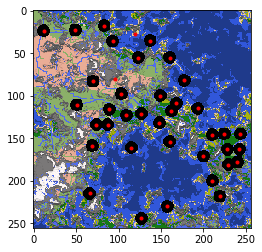

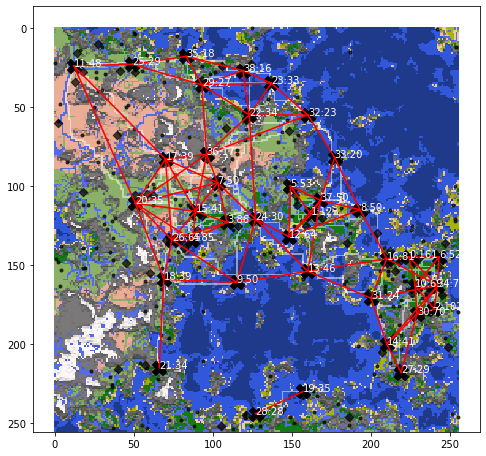

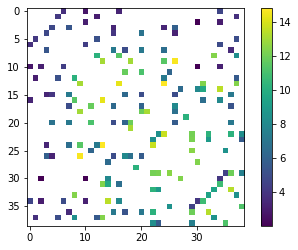

In [37]:
castles_conn=np.full((nCastles,nCastles),False)
castles_dist=np.full((nCastles,nCastles),float('inf'))
castles_road=np.zeros((size,size))
for _i in tqdm(range(nCastles)):
    i,j=int(castles[_i,0]),int(castles[_i,1])
    source=np.full((size,size),False)
    source[i,j]=True
    castles_cutoff2=castles_nearest_dist[_i,2]*1.5
    for _j in range(nCastles):
        if _j>_i and castles_dist_approx[_i,_j]<castles_cutoff2:
            ii,jj=int(castles[_j,0]),int(castles[_j,1])
            banned=np.zeros((size,size))
            for _k in range(nCastles):
                if _k!=_i and _k!=_j:
                    iii,jjj=int(castles[_k,0]),int(castles[_k,1])
                    banned[iii,jjj]=1
            banned=convolve2d(banned,
                              np.where(get_diffuse_kernel(np.int(2*zoom*0.6),False)>0.5,1,0),mode='same')>0
            #plt.imshow(blend_mono(color_lit,[0,0,0],banned))
            #plt.scatter(castles[:,1],castles[:,0],c='red',marker='.')
            dist,orig=pfa(source=source,
                                cost=travel_cost_land,
                                banned=banned,
                                cutoff=castles_cutoff2)
            #print(_i,_j,castles_dist[_i,_j],dist[ii,jj])
            if dist[ii,jj]<=castles_cutoff2:
                walkRoad(castles_road,orig,ii,jj,i,j,weight=1)
                castles_conn[_i,_j]=castles_conn[_j,_i]=True
                castles_dist[_i,_j]=castles_dist[_j,_i]=dist[ii,jj]
    #plt.imshow(blend_mono(color_lit,[1,0,0],np.where(castles_road>0,1,0)))
    #plt.scatter(castles[:,1],castles[:,0],c='red',marker='.')
    #plt.show()
    #castles_road=np.zeros((size,size))
    #assert(False)
    
plt.imshow(blend_mono(color_lit,[0,0,0],banned))
plt.scatter(castles[:,1],castles[:,0],c='red',marker='.')
plt.show()

fig =plt.figure(figsize=(8,8))
ax = fig.gca()
plt.imshow(blend_mono(color_lit,[1,1,1],np.where(castles_road>0,0.5,0)))
#plt.imshow(color_lit)
plt.scatter(castles[:,1],castles[:,0],c='black',marker='X',s=200)
plt.scatter(villages[:,1],villages[:,0],c='black',marker='.',alpha=0.7)
plt.scatter(towns[:,1],towns[:,0],c='black',marker='D',alpha=0.7)
nCastles=len(castles)
for k in range(nCastles):
    plt.annotate("{:d}:{:.0f}".format(k,castles[k,2]), (castles[k,1], castles[k,0]),color='white')
for _i in range(nCastles):
    i,j=int(castles[_i,0]),int(castles[_i,1])
    for _j in range(nCastles):
        if _j>_i and castles_conn[_i,_j]:
            ii,jj=int(castles[_j,0]),int(castles[_j,1])
            line=matplotlib.lines.Line2D([j,jj],[i,ii],color='red')
            ax.add_line(line)
plt.show()
plt.colorbar(plt.imshow(castles_dist,cmap='viridis'))
plt.show()

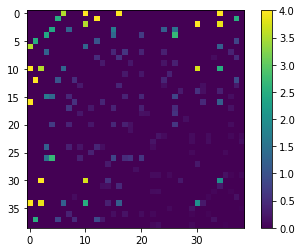

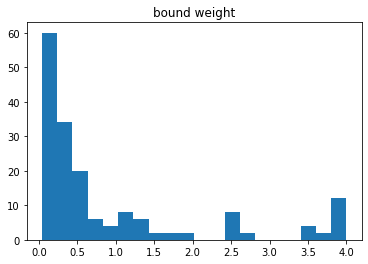

In [38]:
bound=(np.tensordot(castles[:,2],np.ones(nCastles),0)\
    *np.tensordot(np.ones(nCastles),castles[:,2],0))\
    /castles_dist
tmp=bound.flatten()
bound=np.clip(bound/np.average(tmp[tmp!=0]),0,4)
plt.colorbar(plt.imshow(bound,cmap='viridis'))
plt.show()
plt.hist(bound.flatten()[bound.flatten()>0],bins=20)
plt.title('bound weight')
plt.show()

In [50]:
# Introduction to Cluster Monte Carlo Algorithms
# http://csml.northwestern.edu/resources/Reprints/lnp_color.pdf

alignment=np.array(range(nCastles))
alignment_count=np.ones(nCastles,dtype=np.int8)
E=0
np.random.seed(seed+histseed+1)

total_years=2000
steps_per_year=max((nCastles/30),1)
total_steps=int(total_years*steps_per_year)
opened,closed,oldA,newA=[],[],-1,-1
rotation=[[],[],-1,-1]
snapshots=[]
migration=[]

assert bound[0,0]==0

for _i in tqdm(range(total_steps)):
    year=int(_i/steps_per_year)
    beta=12
    alignment_count=np.array([np.sum(alignment==j) for j in range(nCastles)])
    rotation,opened,closed,oldA,newA=[opened,closed,oldA,newA],rotation[0],rotation[1],rotation[2],rotation[3]
    if len(opened)==0: #choose a new alignment
        target=np.random.randint(nCastles)
        acceptance=1
        if np.random.random()<acceptance:
            oldA=alignment[target]
            p=bound[target,:].copy()
            p[target]=1
            origin=np.random.choice(nCastles,p=p/np.sum(p))
            newA=alignment[origin] if origin!=target else target
            opened.append((target,origin))
            closed=[]
    if len(opened)>0:
        # flip according to opened
        target,origin=opened.pop(-1)#-1 dfs +1 bfs
        alignment[target]=newA
        # add neighbors to opened
        for forward in range(nCastles):
            if alignment[forward]==oldA and not forward in closed:
                acceptance=1-exp(-beta*bound[target,forward])
                closed.append(forward)
                if np.random.random()<acceptance:
                    opened.append((forward,target))
    else:
        target,origin=-1,-1
    #statistics
    if origin!=-1:
        migration.append((origin,target,newA))
    if np.floor(year)!=np.floor(year-1/steps_per_year):
        tmp=np.tensordot(alignment,np.ones(nCastles),0)
        energy=np.sum(beta*(tmp==tmp.T))/nCastles
        snapshots.append({'beta':beta,
                          'alignment':alignment.copy(),
                          'year':year,
                          'energy':energy,
                          'nation_count':len(set(alignment)),
                          'opened_size':len(opened),
                          'migration':migration,
                         })
        migration=[]

100%|████████████████████████████████████████████████████████████████████████████| 2600/2600 [00:00<00:00, 3931.88it/s]


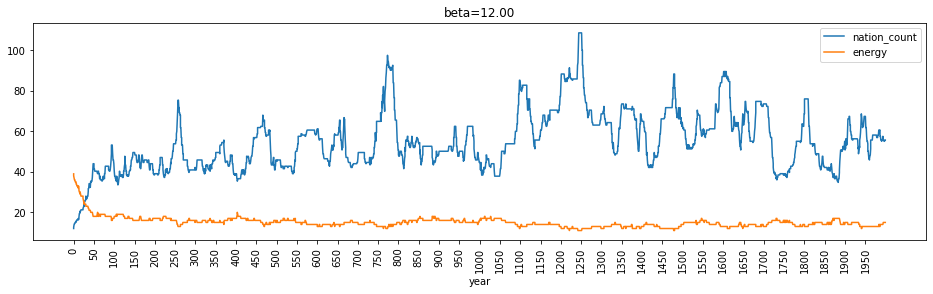

In [51]:
plt.figure(figsize=(16,4))
years=[i['year'] for i in snapshots]
plt.plot(years,[i['energy'] for i in snapshots])
plt.plot(years,[i['nation_count'] for i in snapshots])
plt.legend(['nation_count','energy'])
plt.title('beta={:.2f}'.format(beta))
plt.xlabel('year')
plt.xticks(range(0,total_years,50),rotation=90)
plt.show()

In [52]:
def getReign(alignment):
    reign=np.full((size,size),-1,dtype=np.int16)
    dist=np.full((size,size),float('inf'))
    opened=[]
    cost=travel_cost_land
    for _i in range(len(castles)):
        ii,jj=int(castles[_i][0]),int(castles[_i][1])
        opened.append((0,ii,jj,alignment[_i]))
    heapq.heapify(opened)
    while len(opened)>0:
        d,i,j,r=heapq.heappop(opened)
        if dist[i,j]>d:
            dist[i,j]=d
            reign[i,j]=r
            for oo,delta in enumerate(dirs):
                ii,jj=i+delta[0],j+delta[1]
                if 0<=ii and ii<size and 0<=jj and jj<size:
                    if elevation[ii,jj]>-0.15:
                        c=cost[ii,jj,oo]
                        if dist[ii,jj]>d+c:
                            heapq.heappush(opened,(d+c,ii,jj,r))
    return reign

In [53]:
country_names=['Waskeivania','Zusmuolor','Kswua','Juspana','Briayae','Thuonga','Oscait','Athein','Glayh Smor','Bleil Trua','Egleiburg','Asnayburg','Nesparia','Ieflain','Glievania','Croigro','Train','Bristan','Steai Drain']*10
color_cycle=[u'#1f77b4', u'#ff7f0e', u'#2ca02c', u'#d62728', u'#9467bd', u'#8c564b', u'#e377c2', u'#7f7f7f', u'#bcbd22', u'#17becf']*10


C:\Users\15617\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


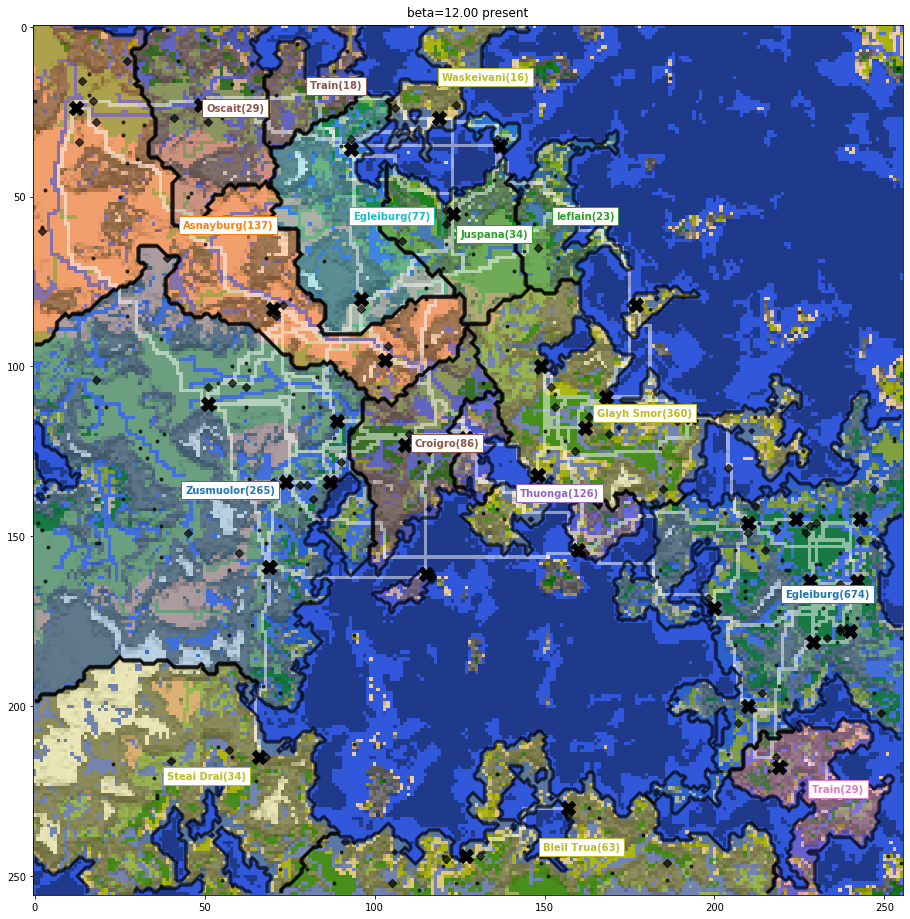

In [54]:
#tmp={k:v for v,k in enumerate(set(alignment))}
#alignment=[tmp[x] for x in alignment]
def drawMap(fig,alignment,title,name_length=10,alpha_politic=0.5,migration=[]):
    color_output=color_lit.copy()
    patches=[]
    ax = fig.gca()
    reign=getReign(alignment)
    for a in range(nCastles):
        rei=reign==a
        nationsize=np.sum(np.where(rei,1,0))
        nationpop=np.sum(castles[alignment==a,2])
        if nationsize>0:
            patches+=plt.contour(rei,colors='black',alpha=0.3).collections 
            x=np.sum(xcoord,where=rei)/nationsize*zoom
            y=np.sum(ycoord,where=rei)/nationsize*zoom
            color=color_cycle[a]
            name=country_names[a][:name_length]
            t=plt.annotate(name+"({:.0f})".format(nationpop), (y,x),color=color,weight='bold')
            t.set_bbox(dict(facecolor='white', alpha=1, edgecolor=color))
            patches+=[t]
            color_output=blend_mono(color_output,matplotlib.colors.to_rgb(color),np.where(rei,alpha_politic,0))
    color_output=blend_mono(color_output,[1,1,1],np.where(castles_road>0,0.5,0))
    patches+=[plt.imshow(color_output)]
    
    patches+=[plt.scatter(villages[:,1],villages[:,0],c='black',marker='.',alpha=0.7)]
    patches+=[plt.scatter(towns[:,1],towns[:,0],c='black',marker='D',alpha=0.7)]
    #patches+=[plt.scatter(castles[:,1],castles[:,0],c='red',marker='X',s=200)]
    for k in range(nCastles):
        color=color_cycle[alignment[k]]
        name=country_names[alignment[k]][:name_length]
        patches+=[plt.scatter(castles[k,1],castles[k,0],c='black',marker='X',s=200)]
        '''t=plt.annotate(name+"({:.0f})".format(castles[k,2]),
                     (castles[k,1], castles[k,0]),color=color,weight='bold')
        t.set_bbox(dict(facecolor='white', alpha=1, edgecolor=color))
        patches+=[t]'''
    '''for _i in range(nCastles):
        i,j=int(castles[_i,0]),int(castles[_i,1])
        for _j in range(nCastles):
            if _j>_i and castles_conn[_i,_j]:
                ii,jj=int(castles[_j,0]),int(castles[_j,1])
                line=matplotlib.lines.Line2D([j,jj],[i,ii],color='black')
                ax.add_line(line)
                patches+=[line]'''
    for mig in migration:
        i,j=int(castles[mig[0],0]),int(castles[mig[0],1])
        ii,jj=int(castles[mig[1],0]),int(castles[mig[1],1])
        color=color_cycle[mig[2]]
        patches+=[plt.arrow(j,i,jj-j,ii-i,color='red',width=1)]
    title_obj = ax.text(0.5,1.01,title, 
                    size=plt.rcParams["axes.titlesize"],
                    ha="center", transform=ax.transAxes, )
    patches+=[title_obj]# title is buggy
    #plt.show()
    return patches
fig=plt.figure(figsize=(16,16))
patches=drawMap(fig,alignment,
                title="beta={:.2f} present".format(snapshots[-1]['beta']),
               alpha_politic=0.3)
fig.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:14<00:00,  1.32it/s]


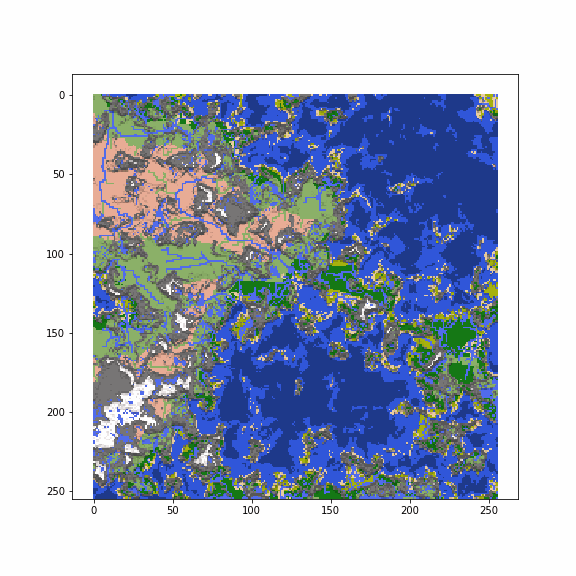

In [45]:
fig = plt.figure(figsize=(8,8))
ims = [[plt.imshow(color_lit)]]
start,end,interval=0,2000,100
for year in tqdm(range(int(start*steps_per_year),min(int((end+interval)*steps_per_year),total_steps),int(interval*steps_per_year))):
    title="beta={:.2f} year {:.0f}/{:.0f}".format(snapshots[year]['beta'],snapshots[year]['year'],total_years)
    mig=[inner for outer in [j['migration'] for j in snapshots[max(0,year-interval+1):year+1]] for inner in outer]
    patches=drawMap(fig,snapshots[year]['alignment'],title,name_length=2,migration=mig)
    ims.append(patches)
plt.close()
ani = animation.ArtistAnimation(fig, ims, interval=700, blit=False)
ani.save("ani.gif", writer='pillow')
with open('ani.gif','rb') as file:
    display(Image(file.read()))

100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:20<00:00,  1.14it/s]


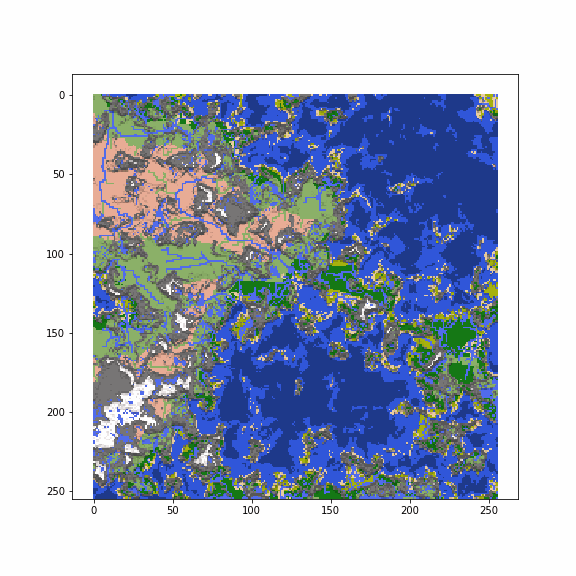

In [32]:
fig = plt.figure(figsize=(8,8))
ims = [[plt.imshow(color_lit)]]
start,end,interval=300,340,2
for year in tqdm(range(int(start*steps_per_year),int((end+interval)*steps_per_year),int(interval*steps_per_year))):
    title="beta={:.2f} year {:.0f}/{:.0f}".format(snapshots[year]['beta'],snapshots[year]['year'],total_years)
    mig=[inner for outer in [j['migration'] for j in snapshots[max(0,year-interval+1):year+1]] for inner in outer]
    patches=drawMap(fig,snapshots[year]['alignment'],title,name_length=2,migration=mig)
    ims.append(patches)
plt.close()
ani = animation.ArtistAnimation(fig, ims, interval=700, blit=False)
ani.save("ani.gif", writer='pillow')
with open('ani.gif','rb') as file:
    display(Image(file.read()))

100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [00:15<00:00,  1.20it/s]


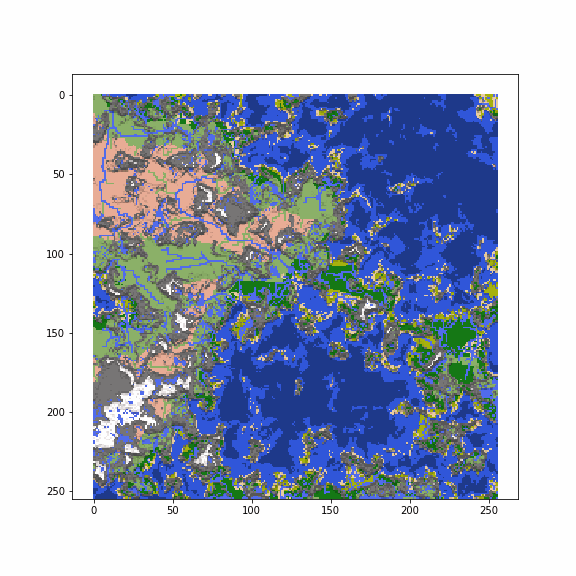

In [33]:
fig = plt.figure(figsize=(8,8))
ims = [[plt.imshow(color_lit)]]
start,end,interval=500,700,10
for year in tqdm(range(int(start*steps_per_year),int((end+interval)*steps_per_year),int(interval*steps_per_year))):
    title="beta={:.2f} year {:.0f}/{:.0f}".format(snapshots[year]['beta'],snapshots[year]['year'],total_years)
    mig=[inner for outer in [j['migration'] for j in snapshots[max(0,year-interval+1):year+1]] for inner in outer]
    patches=drawMap(fig,snapshots[year]['alignment'],title,name_length=2,migration=mig)
    ims.append(patches)
plt.close()
ani = animation.ArtistAnimation(fig, ims, interval=700, blit=False)
ani.save("ani.gif", writer='pillow')
with open('ani.gif','rb') as file:
    display(Image(file.read()))

In [34]:
assert False


AssertionError: 

In [ ]:
alignment=np.array(range(nCastles))
alignment_count=np.ones(nCastles,dtype=np.int8)
betas=[]
energies=[]
nationCounts=[]
E=0
np.random.seed(seed+histseed+1)
psi0=np.random.random()
years=[]
snapshots=[]
isEmpire=np.full(nCastles,-1)
empireCount=0
empireHistory=[]

total_years=1000
total_steps=int(total_years*nCastles)
for _i in tqdm(range(total_steps)):
    year=_i/nCastles
    beta=5
    i=np.random.randint(nCastles)
    oldA=alignment[i]
    oldE=np.sum(bound[i],where=alignment==oldA)
    p=np.zeros(nCastles)
    for j in range(nCastles):
        if bound[i,j]>0:
            p[j]=1
    p[i]=1
    p=p/np.sum(p)
    newA=np.random.choice(nCastles,p=p)
    newE=np.sum(bound[i],where=alignment==newA)
    acceptance=exp(beta*(newE-oldE))
    if np.random.random()<acceptance:
    #if newE>oldE:
        alignment_count[oldA]-=1
        alignment_count[newA]+=1
        alignment[i]=newA
        E=E+newE-oldE
    #statistics
    if year>25:
        for j in range(nCastles):
            if alignment_count[j]>=3 and isEmpire[j]==-1: # an Empire rises
                isEmpire[j]=empireCount
                empireCount+=1
                empireHistory.append({'rise':year})
                empireHistory[isEmpire[j]]['max']=alignment_count[j]
            elif alignment_count[j]==0 and isEmpire[j]!=-1: #an Empire falls
                empireHistory[isEmpire[j]]['fall']=year
                isEmpire[j]=-1
            elif isEmpire[j]!=-1:
                empireHistory[isEmpire[j]]['max']=max(alignment_count[j],empireHistory[isEmpire[j]]['max'])
    years.append(year)
    energies.append(E)
    nationCounts.append(np.sum(np.where(alignment_count>0,1,0)))
    betas.append(beta)
    if np.floor(year/1)!=np.floor((year-1/nCastles)/1):
        snapshots.append({'beta':beta,'alignment':alignment.copy(),'year':year})

In [ ]:
plt.figure(figsize=(16,4))

plt.subplot(141).hist(alignment_count[alignment_count>0],bins=np.arange(0,max(alignment_count)+1))
plt.yscale('log')
plt.title('nation size at present')

empire_sizes=[i['max'] for i in empireHistory]
plt.subplot(142).hist(empire_sizes,bins=np.arange(0,max(empire_sizes)+1))
plt.yscale('log')
plt.title('max empire size in history')

empire_lifetimes=[i['fall']-i['rise'] if 'fall' in i else total_years-i['rise'] for i in empireHistory]
plt.subplot(143).hist(empire_lifetimes,bins=100)
plt.yscale('log')
plt.title('empire lifetime')

plt.subplot(144).scatter(empire_sizes,empire_lifetimes)
plt.yscale('log')
plt.xlabel('size')
plt.ylabel('lifetime')
plt.title('beta={:.2f}'.format(beta))
plt.show()

plt.figure(figsize=(16,4))
plt.subplot(311).plot(years,nationCounts)
plt.ylabel('nation count')
plt.subplot(312).plot(years,energies)
plt.ylabel('energy')
ax=plt.subplot(313)
plt.ylabel('beta')
plt.xlabel('year')
ax.plot(years,betas,color='blue')
ax2=ax.twinx()

averagelife,empireCountExisting=0,0
for i,e in enumerate(empireHistory):
    fall=total_years
    if 'fall' in e:
        fall=e['fall']
    else:
        empireCountExisting+=1
    averagelife+=fall-e['rise']
    line=matplotlib.lines.Line2D([e['rise'],fall],[i/empireCount*0.8+0.1]*2,color='black')
    ax2.add_line(line)
#tmp.scatter([i['rise'] for i in empireHistory],np.ones(len(empireHistory)))

print('existing/dead empires: {:d}/{:d}, average life: {:.1f}'.format(
    empireCountExisting,empireCount-empireCountExisting,
    averagelife/empireCount))
plt.show()

In [ ]:
fig=plt.figure(figsize=(20,20))
ax = fig.gca(projection='3d')
# https://matplotlib.org/3.1.0/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html#mpl_toolkits.mplot3d.axes3d.Axes3D
res=1
ef= np.clip(elevation+fill,0,1)
def get_xyz(xpix,ypix):
    z=np.zeros(xpix.shape[0])
    for i in range(xpix.shape[0]):
        z[i]=ef[int(xpix[i]),int(xpix[i])]
    return xpix/zoom,ypix/zoom,z

ax.set_zlim(-size/zoom, size/zoom)
x,y,z=get_xyz(villages[:,0],villages[:,1])
surf = ax.plot_surface(xcoord, ycoord,ef, 
                       zorder=-1,
                       facecolors=color_lit,
                       shade=False,
                       rstride =res,cstride=res)
#ax.scatter(x,y,z,c='red',depthshade=False,zorder=1)
ax.set_axis_off()

plt.show()

In [ ]:
water_dist,dummy=pfa(source=np.isin(biomes,[biomeID['river'],biomeID['lake']]),
                        cost=np.ones((size,size,4))/zoom,
                        banned=elevation<=0)
uneven=np.abs(gradX)+np.abs(gradY)
ax=plt.figure(figsize=(8,8)).subplots(2,2)
plt.colorbar(ax[0,0].imshow(water_dist,cmap='viridis'),ax=ax[0,0])
ax[0,0].contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
ax[0,0].contour(elevation,[0],colors='black')
ax[0,0].contour(elevation,[0.5],colors='grey')
plt.colorbar(ax[0,1].imshow(uneven,cmap='viridis'),ax=ax[0,1])
ax[0,0].contour(np.clip(elevation,0,1),colors='black',alpha=0.1)
ax[0,0].contour(elevation,[0],colors='black')
ax[0,0].contour(elevation,[0.5],colors='grey')
plt.show()

In [ ]:
seed=128
elevation = np.zeros((64,64))
for i in range(64):
    for j in range(64):
        x,y=i/16,j/16
        dx=2*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+15)
        dy=2*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+23)
        elevation[i][j] = 2*noise.pnoise2(x+0.5*dx,y+0.5*dy,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+0)

plt.figure(figsize=(8,8))
plt.gray()
plt.subplot(221).imshow(elevation)
plt.subplot(222).imshow(dist)
plt.show()

In [ ]:
# get river
river=np.zeros((size,size))
dirs=((0,1),(0,-1),(1,0),(-1,0))
np.random.seed(seed+237)
for _i in range(int((size/zoom)**2)*10):
    i,j=np.random.randint(0,size,2)
    p=np.exp(-3*rainshadow[i,j])
    if np.random.random()>=p:
        continue
    amount=30
    while amount>0 and elevation[i,j]>0:
        minneigh=1
        for oo,delta in enumerate(dirs):
            ii,jj=i+delta[0],j+delta[1]
            if 0<=ii and ii<size and 0<=jj and jj<size:
                minneigh=min(minneigh,elevation[ii][jj])
        river[i,j]=np.clip(minneigh-elevation[i][j],0.1,1)
        amount-=1
        ps=np.zeros(4)
        for oo,delta in enumerate(dirs):
            ii,jj=i+delta[0],j+delta[1]
            if 0<=ii and ii<size and 0<=jj and jj<size:
                ps[oo]=np.clip(elevation[i][j]+river[i][j]-elevation[ii][jj],0,1)
        n=np.sum(ps)
        if n==0:
            break
        ps/=n
        o=np.random.choice(4,p=ps)
        i+=dirs[o][0]
        j+=dirs[o][1]
del dirs

In [ ]:
#http://w3.marietta.edu/~biol/biomes/biome_main.htm
darkblue = [45,75,155]
blue = [65,105,225]
rainforest=[34,139,34]
grassland=[153,180,112]
forest=[54,189,54]
desert=[238,214,175]
beach=[238, 214, 175]
snow = [255, 250, 250]
mountain = [139, 137, 137]
def get_biome(elevation,temperature,moisture):
    if elevation<-0.4:
        return darkblue
    elif elevation<0:
        return blue
    elif elevation<0.1:
        return beach
    else:
        if temperature>0.75:
            if moisture>0.4:
                return rainforest
            elif moisture>0.2:
                return grassland
            else:
                return desert
        elif temperature>0.5:
            if moisture>0.5:
                return forest
            elif moisture>0.2:
                return grassland
            else:
                return desert
    return [0,0,0] #unknown
    

In [ ]:
#https://medium.com/@yvanscher/playing-with-perlin-noise-generating-realistic-archipelagos-b59f004d8401
#https://minecraft.gamepedia.com/Biome
#http://www-cs-students.stanford.edu/~amitp/game-programming/polygon-map-generation/
seed=12
elevation = np.zeros((64,64))
temperature = np.zeros((64,64))
for i in range(64):
    for j in range(64):
        x,y=i/16,j/16
        dx=2*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+15)
        dy=2*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+23)
        elevation[i][j] = 2*noise.pnoise2(x+0.5*dx,y+0.5*dy,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+0)
        temperature[i][j]=np.clip(0.8-0.5*np.clip(elevation[i][j],0,1)+noise.pnoise2(x/3,y/3,octaves=2,persistence=0.5,lacunarity=2.0,base=seed+18),0,1)
moisture=np.zeros((64,64))
color = np.zeros((64,64,3))
for i in range(64):
    for j in range(64):
        x,y=i/16,j/16
        wx=2*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+32)
        wy=2*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+33)
        e0=elevation[i][j]
        e1=sample2D(elevation,i-8*wx,j-8*wy)
        e2=sample2D(elevation,i-16*wx,j-16*wy)
        e3=sample2D(elevation,i-24*wx,j-24*wy)
        e4=sample2D(elevation,i-32*wx,j-32*wy)
        moisture[i][j]+=1 if e1<0 else 0
        moisture[i][j]+=np.clip(1+e0-2*e1,0,1) if e2<0 else 0
        moisture[i][j]+=np.clip(1+e0-e1-e2,0,1) if e3<0 else 0
        moisture[i][j]+=np.clip(1+e0-e2-e3,0,1) if e4<0 else 0
        moisture[i][j]=np.clip(moisture[i][j],0,1)
        moisture[i][j]=-0.5 if e0<0 else moisture[i][j]
        color[i][j]=get_biome(elevation[i][j],temperature[i][j],moisture[i][j])
plt.figure(figsize=(8,8))
plt.gray()
plt.subplot(221).imshow(elevation)
plt.subplot(222).imshow(temperature)
plt.subplot(223).imshow(moisture)
plt.subplot(224).imshow(color/255)
plt.show()

In [ ]:

def get_diffuse_kernel(n):
    x,y=np.mgrid[0:n,0:n]
    x,y=x/(n-1)*2-1,y/(n-1)*2-1
    rtval=np.exp(-(x**2+y**2))
    return rtval/np.sum(rtval)
v00=convolve2d(v00,get_diffuse_kernel(6),boundary='wrap')
v01=convolve2d(v01,get_diffuse_kernel(6),boundary='wrap')

In [ ]:
np.floor(0.1)

In [ ]:
darkblue = [45,75,155]
blue = [65,105,225]
green = [34,139,34]
beach = [238, 214, 175]
snow = [255, 250, 250]
mountain = [139, 137, 137]

def add_color(elevation):
    color_world = np.zeros(elevation.shape+(3,))
    for i in range(elevation.shape[0]):
        for j in range(elevation.shape[1]):
            if elevation[i][j] < -0.4:
                color_world[i][j] = darkblue
            elif elevation[i][j] < 0:
                color_world[i][j] = blue
            elif elevation[i][j] < 0.1:
                color_world[i][j] = beach
            elif elevation[i][j] < 0.5:
                color_world[i][j] = green
            elif elevation[i][j] < 0.7:
                color_world[i][j] = mountain
            else:
                color_world[i][j] = snow
    return color_world/255


color_world = add_color(elevation)
plt.figure(figsize=(8,8))
plt.imshow(color_world)
plt.show()

In [ ]:
# get elevation
seed=28
size=256
zoom=32
zoom2=8
y0,x0=1,0
distortion=2
elevation = np.zeros((size,size))
gammas = np.zeros((size,size))
xcoord,ycoord=np.mgrid[0:size,0:size]/zoom
for i in range(size):
    for j in range(size):
        x,y=i/zoom+x0,j/zoom+y0
        dx=2*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+15)
        dy=2*noise.pnoise2(x,y,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+23)
        gamma=noise.pnoise2(x/zoom2,y/zoom2,octaves=2,persistence=0.5,lacunarity=2,base=seed+66)
        gamma=np.exp(3*gamma+0.2)
        value=0.5+noise.pnoise2(x+0.5*dx,y+0.5*dy,octaves=4,persistence=0.5,lacunarity=2.0,base=seed+0)
        value=value**gamma
        gammas[i][j]=gamma
        elevation[i][j] = 2*value-1
#r=np.sqrt((xcoord-2)**2+(ycoord-2)**2)
#elevation=0.5-0.4*((r-0.5)/0.5)**2

plt.figure(figsize=(4,4))
#plt.imshow(np.clip(elevation,0,1))
plt.imshow(gammas,cmap='viridis')
plt.colorbar()
plt.imshow(elevation>0,alpha=0.5)
plt.contour(np.clip(elevation,0,1))
plt.show()